<a href="https://colab.research.google.com/github/disenodc/Imagenes_ML_UNS/blob/main/Copia_de_Aprobacion_del_curso_Tarea_Entregable_Imagenes%26IntroML_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Propuesta: haremos la tarea obligatoria mañana sábado de 9 a 11 en aula 23H. Sala de conferencias del Dpto Fisica. Traer compu personal

# 1. **Abrir una imagen y explorar sus datos.**

+ a) Abra la imagen *vegetacion_cielo.jpg* (de la carpeta compartida), grafíquela y muestre la dimensión (cantidad de filas, columnas, canlaes), muestre el tipo de dato que contiene. ✅



**IMPORTANTE: Realice comentarios e interpretaciones personales luego de los bloques de código.**

In [1]:
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#Imagen=cv2.imread('vegetacion_cielo.jpg')

#forzar subida de archivo local a Colab
from google.colab import files
uploaded = files.upload() # seleccionar archivo local



Saving vegetacion_cielo.jpg to vegetacion_cielo.jpg


In [3]:
#mostrar archivo subido
#from IPython.display import Image
#Image(filename='vegetacion_cielo.jpg')

In [4]:
Imagen=cv2.imread('vegetacion_cielo.jpg')
print("El tipo de la primer imagen es ",type(Imagen))
print("El tipo de cada píxel es ",Imagen.dtype)
print("La dimensión de la imagen es ",Imagen.shape)

altura=Imagen.shape[0] #cantidad de filas
ancho=Imagen.shape[1] #cantidad de columnas
canales=Imagen.shape[2] #cantidad de canales o resolución espectral 

print(f"La altura es {altura}.El ancho es {ancho} .Los canales de color son {canales}")



El tipo de la primer imagen es  <class 'numpy.ndarray'>
El tipo de cada píxel es  uint8
La dimensión de la imagen es  (1569, 1879, 3)
La altura es 1569.El ancho es 1879 .Los canales de color son 3


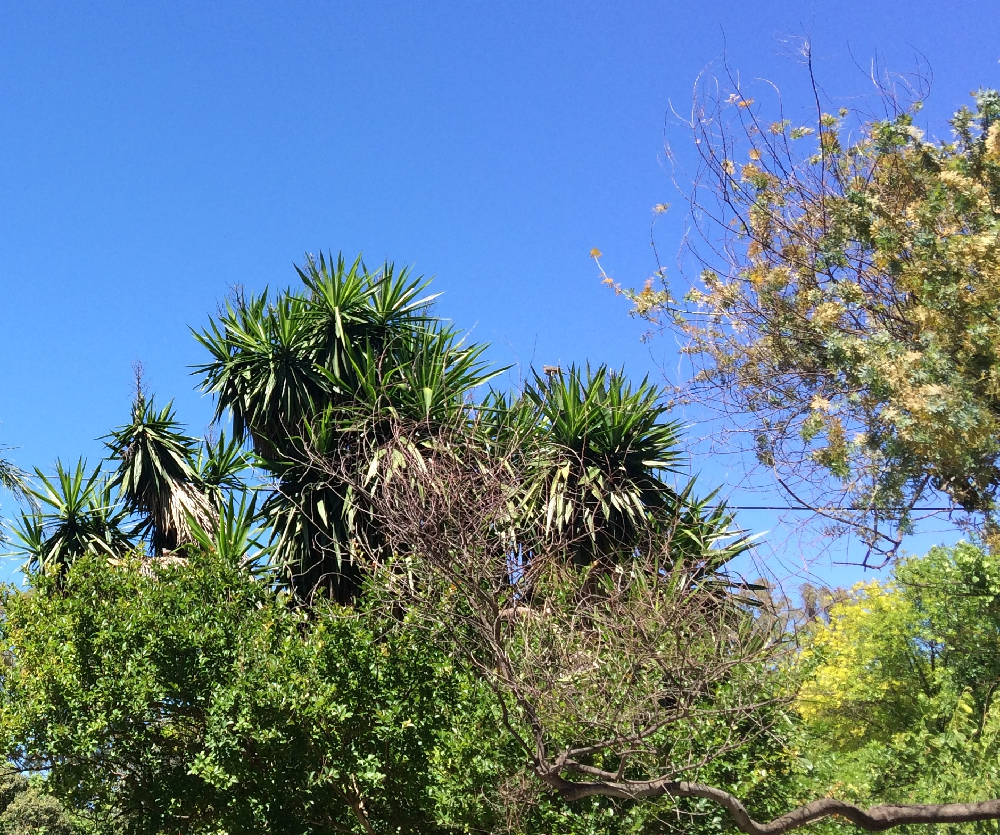

In [5]:
from google.colab.patches import cv2_imshow
cv2_imshow(Imagen)

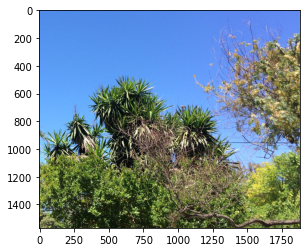

In [6]:
Imagen=cv2.imread('vegetacion_cielo.jpg')
img_rgb=cv2.cvtColor(Imagen,cv2.COLOR_BGR2RGB )
import matplotlib.pyplot as plt
plt.imshow(img_rgb)

In [ ]:
# Al visualizar la imagen de varios metodos se detecta una perdida de valores en la misma.
Imagen[1400:1410,10:20]



In [ ]:
#se verifica que se corrompio el dato por lo que se procede a recortar las areas de dato perdidas

Imagen[1200: , : , : ]==128
# hasta fila 1264 FALSE 


# Desde fila 1265 TRUE = Perdida de dato
Imagen[1265: , : , : ]==128

array([[[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 

In [ ]:
# recortar imagen (1200 )

# especificar las coordenadas y el tamaño del recorte
x = 0
y = 0
w = 1500
h = 1265

# recortar la imagen utilizando las coordenadas y el tamaño especificados
img_recorte = img_rgb[y:y+h, x:x+w]

# mostrar la imagen recortada
cv2.imshow("Recorte", img_recorte)



+ b) Realice el histograma de los 3 canales en un mismo gráfico. **Interprete y comente.** 



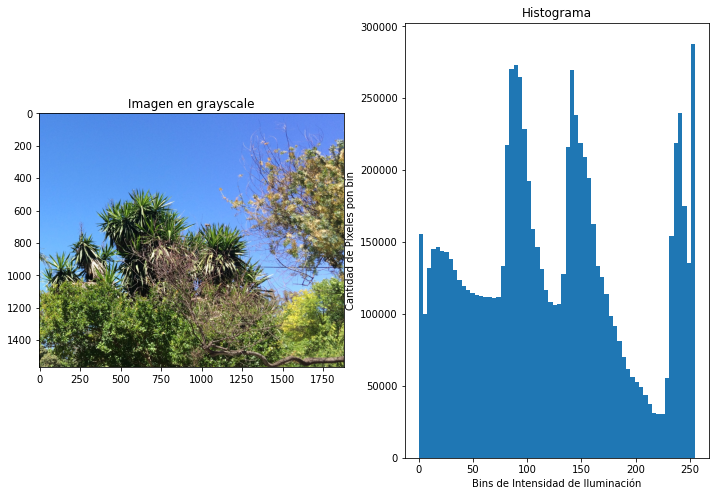

In [7]:
# 1.2 Histograma

import numpy as np

nbins=64
rango=[0,255] #rango de intensidades que quiero que cuente el histograma.
#rango=[0,128]

plt.figure(figsize=(12,8))
plt.subplot(121),plt.imshow(img_rgb,cmap='gray',vmin=0 ,vmax=255), plt.title('Imagen en grayscale')
plt.subplot(122), plt.hist(img_rgb.ravel(),nbins,rango) 
#img.ravel() "estira" img_mono en un vector, es decir concatena las filas de img en un solo vector
plt.xlabel("Bins de Intensidad de Iluminación")
plt.ylabel("Cantidad de Píxeles pon bin")
plt.title("Histograma")
plt.show()


In [8]:
#Chequeamos lo que vemos en el histo que el rango dinámico de la imagen es pequeño 
print(np.min(img_rgb),np.max(img_rgb))

0 255


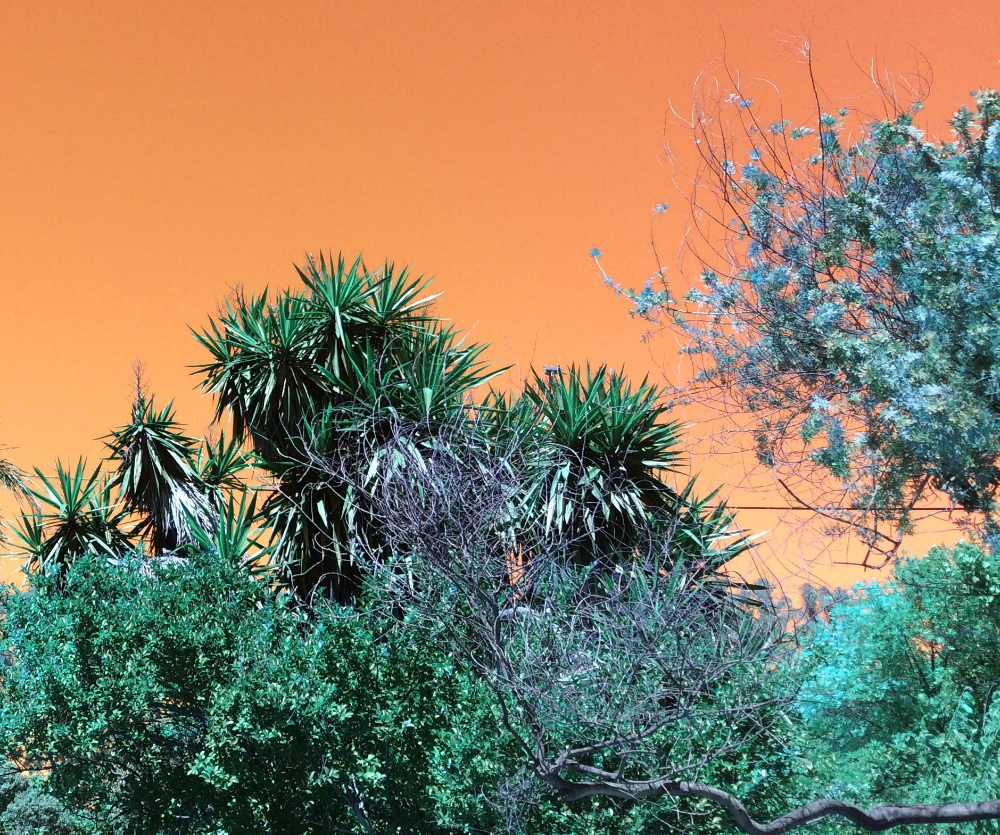

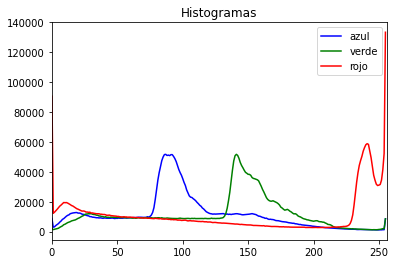

In [9]:
#Histogramas de R, G y B 
#path=''
#img = cv2.imread(path)
cv2_imshow(img_rgb)

color = ('b','g','r')
for i, c in enumerate(color):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color = c)
    plt.xlim([0,256])
plt.title('Histogramas')
plt.legend(['azul','verde','rojo'])
plt.show()

# 2. **Binarización.** 

+ a) Pase la imagen a monocroma. Elija un umbral adecuado para binarizar dicha imagen monocroma, que *intente* separar el cielo de la vegentación, 
+ b) Muestre en subplots, la imagen original, la monocroma en escala de grises y la binarizada. Comente e interprete resultados.

(1569, 1879) 136
la minima intensidad es 0
la maxima intensidad es 255
el tipo de dato de la imagen es uint8


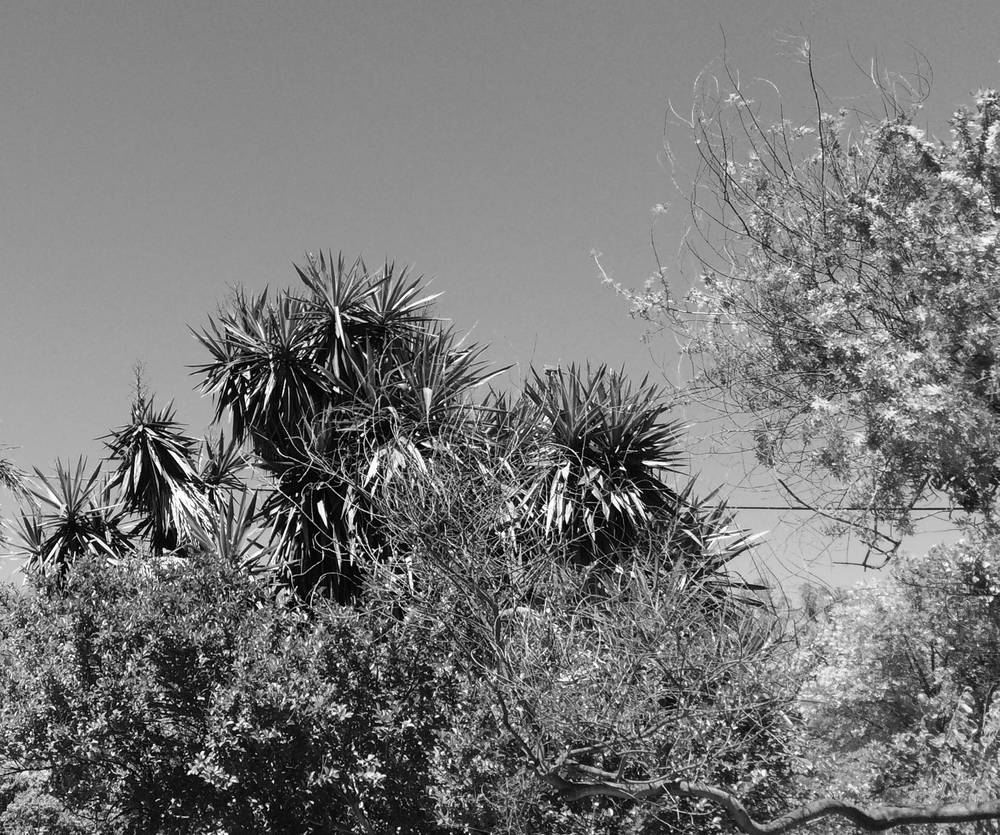

In [10]:
# Convertir la imagen a monocroma
img_mono = cv2.cvtColor(Imagen, cv2.COLOR_BGR2GRAY)

print(img_mono.shape,img_mono[20,30])
print(f'la minima intensidad es {np.min(img_mono)}')
print(f'la maxima intensidad es {np.max(img_mono)}')
print(f'el tipo de dato de la imagen es {img_mono.dtype}')

cv2_imshow(img_mono)

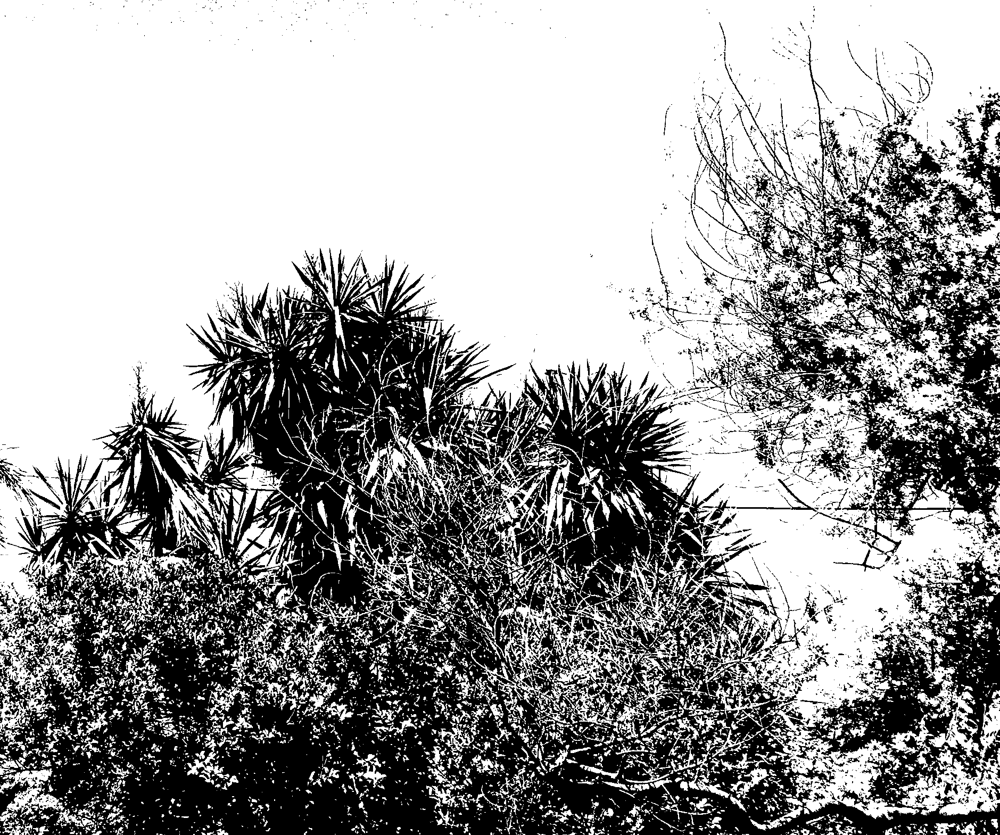

In [11]:
# Binarizar la imagen usando un valor umbral adecuado
# En este caso, se utiliza un valor umbral de 125
# Los píxeles con un valor menor que 125 se establecen en negro
# Los píxeles con un valor mayor o igual a 125 se establecen en blanco
ret, thresh = cv2.threshold(img_mono, 125, 255, cv2.THRESH_BINARY)

# Mostrar la imagen binarizada
cv2_imshow(thresh)

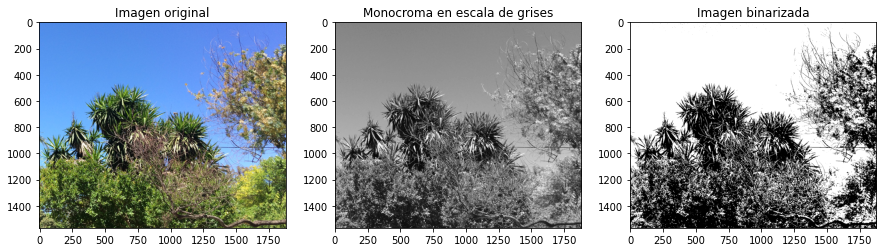

In [12]:
# Mostrar las imágenes en subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(cv2.cvtColor(Imagen, cv2.COLOR_BGR2RGB))
axs[0].set_title('Imagen original')
axs[1].imshow(img_mono, cmap='gray')
axs[1].set_title('Monocroma en escala de grises')
axs[2].imshow(thresh, cmap='gray')
axs[2].set_title('Imagen binarizada')
plt.show()

# 3. **Clustering**

+ a) Pase la misma imagen vegetacion_cielo.jpg, a formato Data Frame (cada pixel en una fila)
+ b) Elija algún modelo de Clusterización (k-means,DBCAN, MeanShift) para realizar clusterización dentro de dicha imagen. 
Utilice las características que crea necesarias  y adecuadas para el problema (RGB a priori, pero pueden ser otras como las usadas en Ntb8).
¿Cuantos clusters recomienda el método del codo? ¿Concuerda con lo que ve en la imagen? 
+ c) Grafique los resultados de la clusterización en el espacio RGB y también en la imagen etiquetada por clusters.Obtuvo los resultados esperados? Comente, interprete.

In [13]:
# Para pasar la imagen a un formato de DataFrame, primero se convierte a monocroma y se aplana la matriz de píxeles en un vector unidimensional.
# Con la biblioteca Pandas podemos crear un DataFrame a partir de este vector

import pandas as pd

# Aplanar la matriz de píxeles en un vector unidimensional
pixels = img_mono.flatten()

# Crear un DataFrame a partir del vector de píxeles
df = pd.DataFrame(pixels, columns=['Pixel'])

# Mostrar las primeras 10 filas del DataFrame
print(df.head(10))

   Pixel
0    132
1    130
2    130
3    131
4    132
5    131
6    130
7    129
8    131
9    131


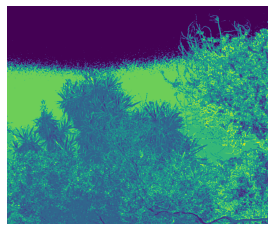

In [14]:
# Para realizar la clusterización de la imagen en este caso, se utiliza una técnica de clustering basada en la información de color RGB.
# Se usa el algoritmo k-means para agrupar los píxeles en k grupos, donde k se selecciona en base a un análisis del método del codo

from sklearn.cluster import KMeans

# Aplanar la matriz de píxeles en un vector unidimensional
pixels = img_rgb.reshape((-1, 3))

# Inicializar un modelo de k-means
kmeans = KMeans(n_clusters=10, n_init=10)

# Ajustar el modelo a los datos de los píxeles
kmeans.fit(pixels)

# Obtener las etiquetas de cluster para cada pixel
labels = kmeans.predict(pixels)

# Reorganizar los píxeles en su forma original
segmented_img = labels.reshape(img_rgb.shape[:2])

# Mostrar la imagen segmentada
plt.imshow(segmented_img)
plt.axis('off')
plt.show()

Para determinar el número óptimo de clusters, podemos utilizar el método del codo, que implica ajustar el modelo de k-means a los datos de los píxeles para diferentes valores de k  y graficar la suma de las distancias al cuadrado de cada punto al centroide de su cluster más cercano

El valor de k para el cual la curva de la suma de las distancias al cuadrado se desacelera significativamente se considera un buen número de clusters.

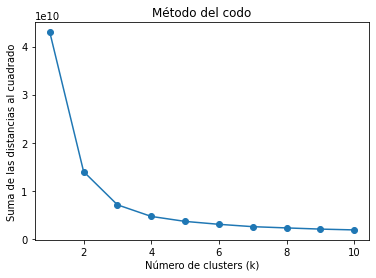

In [15]:
# Calcular la suma de las distancias al cuadrado para diferentes valores de k
inertias = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=0).fit(pixels)
    inertias.append(kmeans.inertia_)

# Graficar la curva de la suma de las distancias al cuadrado
plt.plot(range(1, 11), inertias, '-o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Suma de las distancias al cuadrado')
plt.title('Método del codo')
plt.show()


Para graficar los resultados de la clusterización en el espacio RGB, primero obtenemos los valores RGB de cada punto de datos y las etiquetas de cluster con Matplotlib

/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


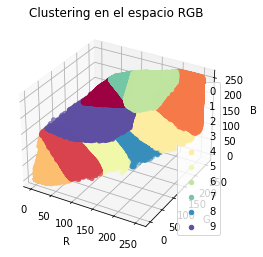

In [17]:
from mpl_toolkits.mplot3d import Axes3D

# 'pixels' contiene los valores RGB de cada punto de datos y 'labels' contiene las etiquetas de cluster correspondientes
# Cree una figura 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Obtenga los valores RGB de cada cluster y etiquételos con un color diferente
unique_labels = np.unique(labels)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
for i, label in enumerate(unique_labels):
    cluster_data = pixels[labels == label]
    ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], c=colors[i], label=label)

# Agregue etiquetas de eje y título
ax.set_xlabel('R')
ax.set_ylabel('G')
ax.set_zlabel('B')
plt.title('Clustering en el espacio RGB')

# Agregue una leyenda para mostrar los diferentes clusters
plt.legend()

# Muestre el gráfico
plt.show()


Para la imagen etiquetada por clusters, se necesita asignar un color diferente a cada etiqueta de cluster y luego reemplazar los valores RGB de cada píxel en la imagen original con el color correspondiente de la etiqueta de cluster. 

In [ ]:
# Crear una matriz de colores con un color diferente para cada etiqueta de cluster
unique_labels = np.unique(labels)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
color_map = {label: colors[i] for i, label in enumerate(unique_labels)}

# Reemplace los valores RGB de cada píxel en la imagen original con el color correspondiente de la etiqueta de cluster
labeled_image = np.zeros_like(pixels)
for label in unique_labels:
    mask = labels == label
    labeled_image[mask] = color_map[label]

# Muestre la imagen etiquetada por clusters
cv2.imshow('Imagen etiquetada por clusters', labeled_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
